Step 1: saving plot data...


/var/folders/n_/_z_q62kx279gp1tfsgqh78s40000gn/T/ipykernel_69170/624505488.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


Step 2: combining the images...
Step 3: Making the video...
Step 4: Deleting unnecessary files...
COMPLETE


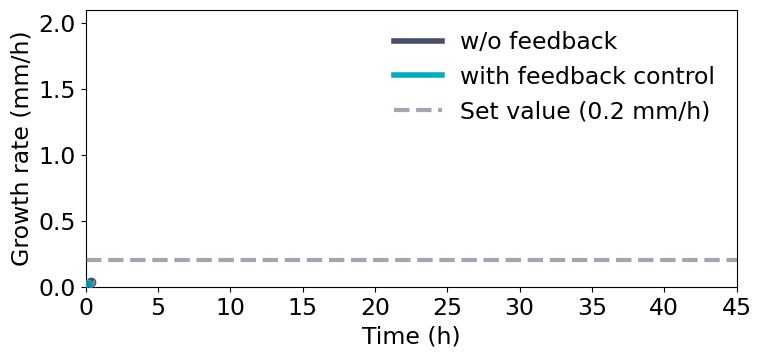

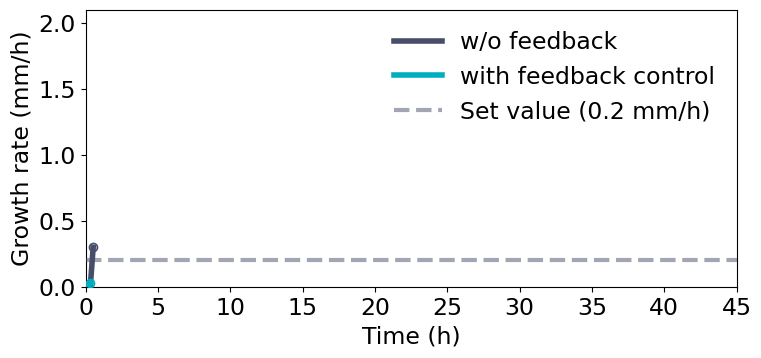

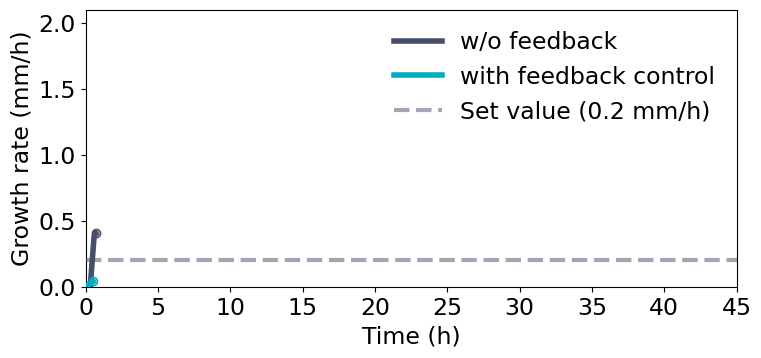

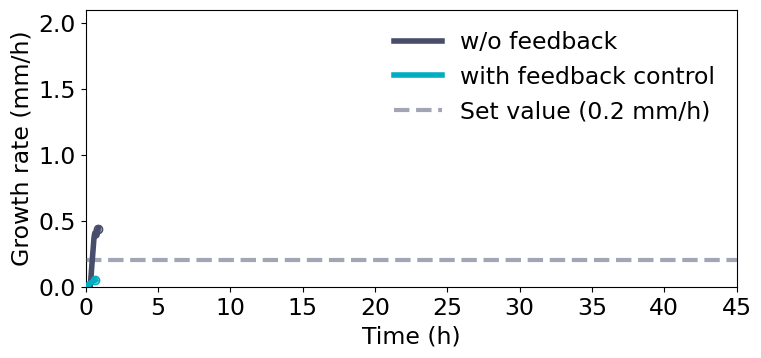

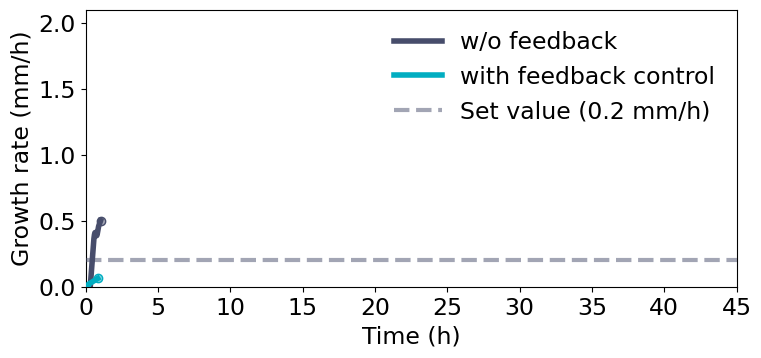

...

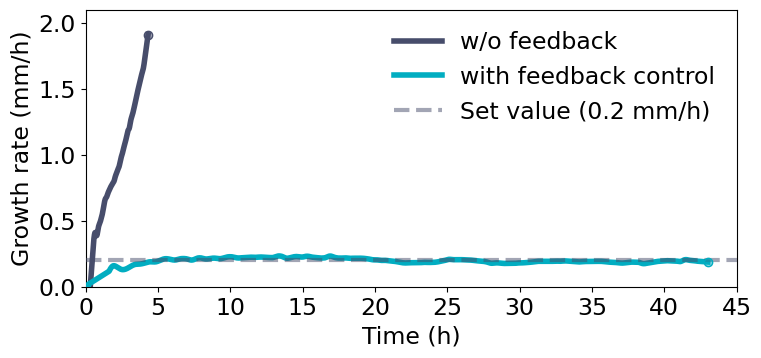

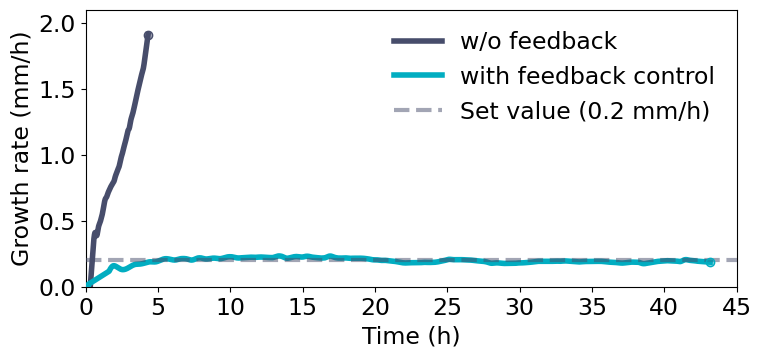

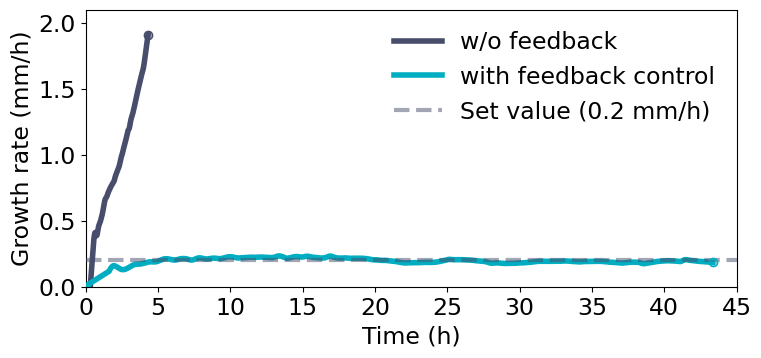

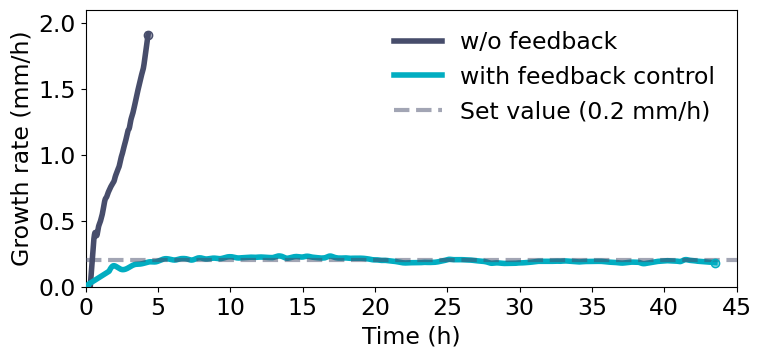

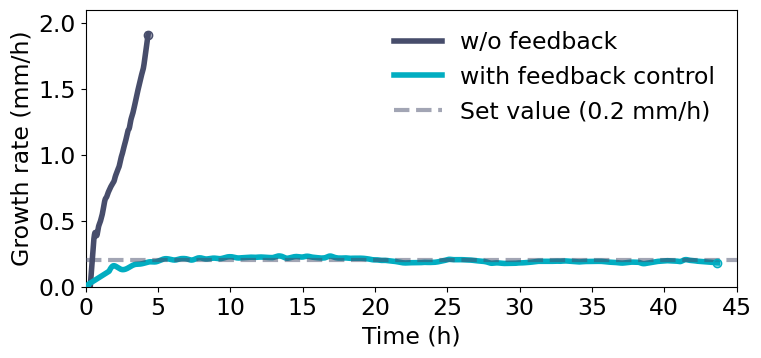

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
import numpy as np
import cv2
import shutil

# Prepare the empty directory for saving plot images
figsavepath = '../Data/Video/plots'
if not os.path.exists(figsavepath):
    os.makedirs(figsavepath)

# No control
path1 = "../Data/Figure2/2023-07-24 data.xlsx"
df1 = pd.read_excel(path1)
X1 = df1['Time (h)'].to_list()
Y1 = df1['Smth_G (mm/h)'].to_list()
L1 = df1['Smth_L (mm)'].to_list()

# Feedback control
path2 = "../Data/Figure2/2023-09-20 data.xlsx"
df2 = pd.read_excel(path2)
X2 = df2['Time (h)'].to_list()
Y2 = df2['Smth_G (mm/h)'].to_list()
L2 = df2['Smth_L (mm)'].to_list()

# Get paths for images
dir1 = '../Data/Video/wo-images'
images1 = glob.glob(os.path.join(dir1, '*.jpg'))
images1.sort()

dir2 = '../Data/Video/fcg-images'
images2 = glob.glob(os.path.join(dir2, '*.jpg'))
images2.sort()

def get_time(path):
    time_str = os.path.splitext(os.path.basename(path))[0].split("_")[1] # get 02h32m54s
    hours = int(time_str.split("h")[0])
    minutes = int(time_str.split("h")[1].split("m")[0])
    seconds = int(time_str.split("m")[1].split("s")[0])
    h = float(hours + minutes/60 + seconds/3600)
    return h

"""
STEP 1
"""
# plot
dpi = 300
width_px = 2520
height_px = 1080
figsize = (width_px / dpi, height_px / dpi)

print('Step 1: saving plot data...')

for i in range(len(images1)):
    if i == 0:
        continue
    else:
        pass
    
    # get time from images
    time1 = get_time(images1[i]) # get time from filename
    time2 = get_time(images2[i])
    
    # Crop the data
    
    # index 1 
    for x1 in X1:
        if x1 < time1:
            pass
        else:
            index1 = X1.index(x1)
            break
    # index 2 
    for x2 in X2:
        if x2 < time2:
            pass
        else:
            index2 = X2.index(x2)
            break
    
    X1_ = X1[:index1]
    Y1_ = Y1[:index1]
    X2_ = X2[:index2]
    Y2_ = Y2[:index2]
    
    l1 = int(L1[index1] * 10)
    l2 = int(L2[index2] * 10)
    l1_text = f'{l1}'
    l2_text = f'{l2}'
    
    # plot
    plt.rcParams["font.size"] = 17
    fig = plt.figure(figsize=figsize)

    # control vs no-control
    plt.plot(X1_,Y1_, color="#474D6B", linewidth=4, label="w/o feedback")
    plt.plot(X2_,Y2_, color='#01ADC1', label='with feedback control', linewidth=4,zorder=3)
    plt.plot([0,45],[0.2,0.2],linestyle='dashed', color="#474D6B80", linewidth=3, zorder=4,label='Set value (0.2 mm/h)')
    plt.scatter([X1_[-1]],[Y1_[-1]], ec = '#474D6B', color='#474D6B80', zorder=5)
    plt.scatter([X2_[-1]],[Y2_[-1]], ec = '#01ADC1', color='#01ADC180', zorder=5)
    plt.xlim(0,45)
    plt.ylim(0,2.1)
    # plt.ylim(0,0.6)
    plt.xticks(np.arange(0,50,5))
    plt.xlabel('Time (h)')
    plt.ylabel('Growth rate (mm/h)')
    plt.legend(frameon=False)

    plt.savefig(f'{figsavepath}/{i:03}_{l1_text}_{l2_text}.jpg', dpi=dpi, bbox_inches='tight')
    
"""
STEP 2
"""

print('Step 2: combining the images...')

dir_A = "../Data/Video/wo-images"
dir_B = "../Data/Video/fcg-images"
dir_C = "../Data/Video/plots"

# Prepare the empty directory for saving combined images
save_dir = "../Data/Video/combined"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Get paths for images
imagesA = glob.glob(os.path.join(dir_A, '*.jpg'))
imagesA.sort()
imagesB = glob.glob(os.path.join(dir_B, '*.jpg'))
imagesB.sort()
imagesC = glob.glob(os.path.join(dir_C, '*.jpg'))
imagesC.sort()

for i in range(len(imagesC)):    
    # Background White
    width = 2400
    height = 2400
    background = np.zeros((height, width, 3), np.uint8)
    background.fill(255)  # white

    # Read images
    imageA = cv2.imread(imagesA[i]) #1080 x 1080
    imageB = cv2.imread(imagesB[i]) #1080 x 1080
    imageC = cv2.imread(imagesC[i]) #2285 x 1075

    # Put images on the background
    background[100:100+1080, 80:80+1080] = imageA
    background[100:100+1080, 1240:1240+1080] = imageB
    background[1250:1250+1075, 60:60+2285] = imageC
    
    # put rectangle
    cv2.rectangle(background, (80,50), (80+1080,150), (107,77,71), -1) # w/o feedback
    cv2.rectangle(background, (1240,50), (1240+1080,150), (193,173,1), -1) # w feedback
    cv2.rectangle(background, (80,1120), (80+1080,1220), (107,77,71), -1) # w/o feedback
    cv2.rectangle(background, (1240,1120), (1240+1080,1220), (193,173,1), -1) # w feedback
    
    # text
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(background, "w/o feedback", (320,120), font, 2.5, (255,255,255), 10)
    cv2.putText(background, "with feedback", (1500,120), font, 2.5, (255,255,255), 10)

    time_text_1 = os.path.splitext(os.path.basename(imagesA[i]))[0].split('_')[1]
    time_text_2 = os.path.splitext(os.path.basename(imagesB[i]))[0].split('_')[1]
    l1 = float(os.path.splitext(os.path.basename(imagesC[i]))[0].split('_')[1])
    l2 = float(os.path.splitext(os.path.basename(imagesC[i]))[0].split('_')[2])
    
    text1 = f'{time_text_1}, {l1/10:.1f}mm'
    text2 = f'{time_text_2}, {l2/10:.1f}mm'
    cv2.putText(background, text1, (220,1190), font, 2.5, (255,255,255), 10)
    cv2.putText(background, text2, (1380,1190), font, 2.5, (255,255,255), 10)
        
    # image resize
    background = cv2.resize(background, (1080,1080))

    # save images
    cv2.imwrite(f'{save_dir}/{i:03}.jpg', background)

print('Step 3: Making the video...')

def images_to_video(directory,frame_rate,size,output):
    
    # Get all jpg files in the directory
    images = glob.glob(os.path.join(directory, '*.jpg'))
    images.sort()

    # Set up the video writer
    video = cv2.VideoWriter(output, cv2.VideoWriter_fourcc(*'mp4v'), frame_rate, size)

    # Convert images to video
    for img in images:
        image = cv2.imread(img)
        image_resized = cv2.resize(image, size)
        video.write(image_resized)

    # Release the writer
    video.release()
    
# Path to the directory containing images
directory = '../Data/Video/combined'
save_dir = '../Data/Video' 
save_name = f"{save_dir}/video1.mov" # filename

# Settings for the output video
output = save_name
frame_rate = 10  # Frame rate

width = 2400
height = 2400

size = (width, height)  # Size of the output video

images_to_video(directory,frame_rate,size,output)

print('Step 4: Deleting unnecessary files...')
shutil.rmtree('../Data/Video/combined')
shutil.rmtree('../Data/Video/plots')
print('COMPLETE')